In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from pandas_profiling import ProfileReport
import numpy as np
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [24]:
df = pd.read_csv('Firm_level_data (9).csv')

In [25]:
df

,Unnamed: 0,sales,capital,patents,randd,employment,sp500,tobinq,value,institutions
0,0,826.995050,161.603986,10,382.078247,2.306000,no,11.049511,1625.453755,80.27
1,1,407.753973,122.101012,2,0.000000,1.860000,no,0.844187,243.117082,59.02
2,2,8407.845588,6221.144614,138,3296.700439,49.659005,yes,5.205257,25865.233800,47.70
3,3,451.000010,266.899987,1,83.540161,3.071000,no,0.305221,63.024630,26.88
4,4,174.927981,140.124004,2,14.233637,1.947000,no,1.063300,67.406408,49.46
...,...,...,...,...,...,...,...,...,...,...
754,754,1253.900196,708.299935,32,412.936157,22.100002,yes,0.697454,267.119487,33.50
755,755,171.821025,73.666008,1,0.037735,1.684000,no,NaN,228.475701,46.41
756,756,202.726967,123.926991,13,74.861099,1.460000,no,5.229723,580.430741,42.25
757,757,785.687944,138.780992,6,0.621750,2.900000,yes,1.625398,309.938651,61.39


In [26]:
# Data exploration and visualization
print(df.head())
print(df.info())
print(df.describe())

   Unnamed: 0        sales      capital  patents        randd  employment  \
0           0   826.995050   161.603986       10   382.078247    2.306000   
1           1   407.753973   122.101012        2     0.000000    1.860000   
2           2  8407.845588  6221.144614      138  3296.700439   49.659005   
3           3   451.000010   266.899987        1    83.540161    3.071000   
4           4   174.927981   140.124004        2    14.233637    1.947000   

  sp500     tobinq         value  institutions  
0    no  11.049511   1625.453755         80.27  
1    no   0.844187    243.117082         59.02  
2   yes   5.205257  25865.233800         47.70  
3    no   0.305221     63.024630         26.88  
4    no   1.063300     67.406408         49.46  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 759 entries, 0 to 758
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    759 non-null    int64  
 1   sale

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Handeling the missing values 

In [27]:
# Calculate the median of the 'tobinq' column
median_tobinq = df['tobinq'].median()

# Impute null values in the 'tobinq' column with the median
df['tobinq'].fillna(median_tobinq, inplace=True)

# Verify that the null values have been replaced with the median
print(df['tobinq'].isnull().sum())

0


In [28]:
df.isna().any()

Unnamed: 0      False
sales           False
capital         False
patents         False
randd           False
employment      False
sp500           False
tobinq          False
value           False
institutions    False
dtype: bool

#### Box Plot 

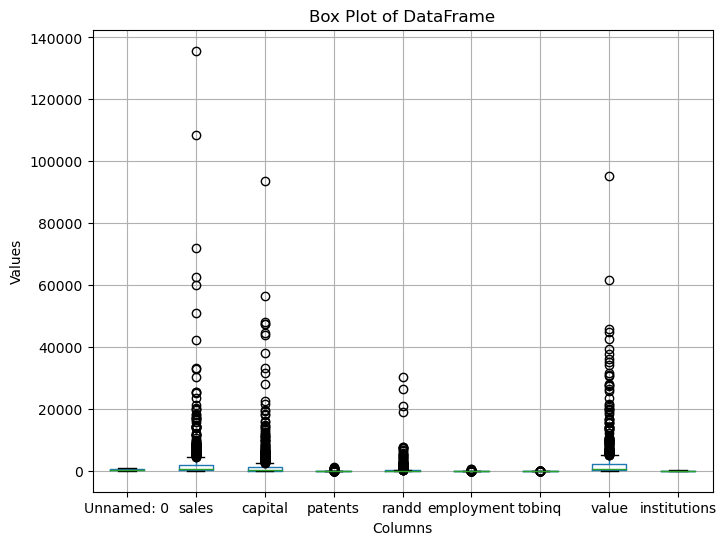

In [29]:
# Create a box plot for the DataFrame
plt.figure(figsize=(8, 6))
df.boxplot()
plt.title("Box Plot of DataFrame")
plt.xlabel("Columns")
plt.ylabel("Values")
plt.show()

In [30]:
categorical_columns = ['sp500']

# Identify numeric columns for scaling
numeric_columns = ['sales', 'capital', 'patents', 'randd', 'employment', 'tobinq', 'value', 'institutions']

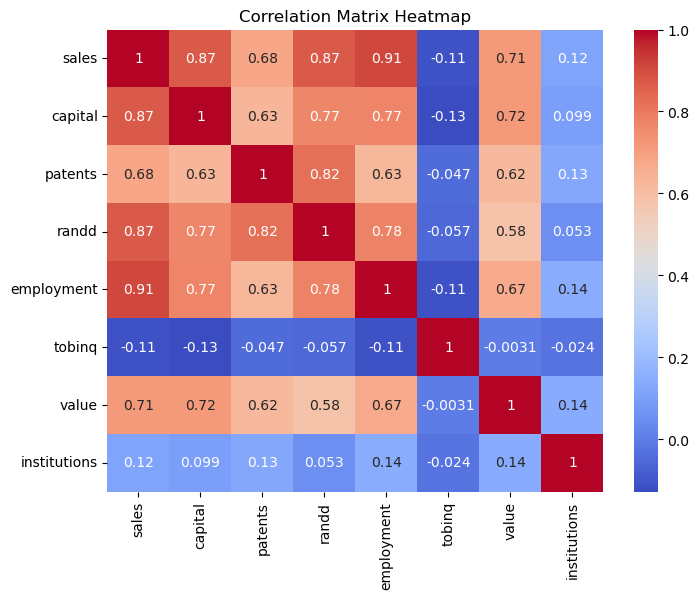

In [31]:
# Correlation matrix heatmap to show the correlation between all numeric columns
plt.figure(figsize=(8, 6))
sns.heatmap(df[numeric_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

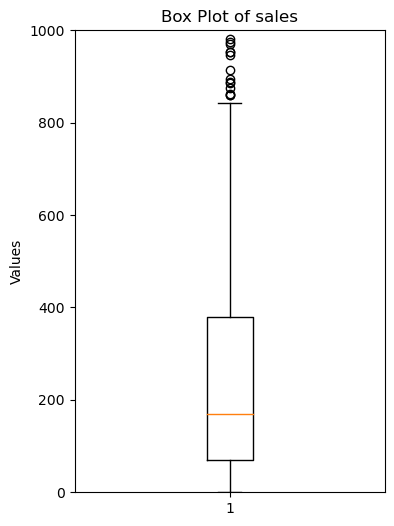

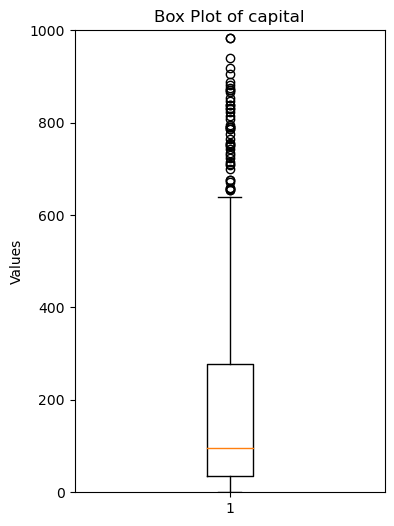

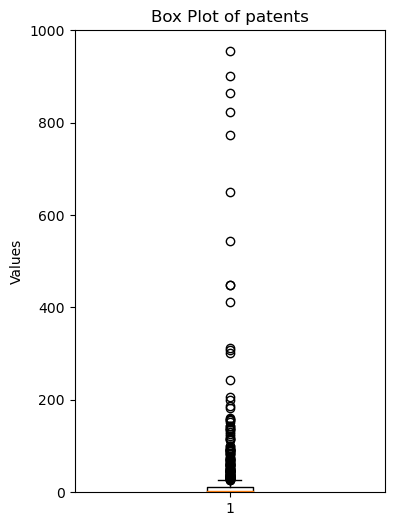

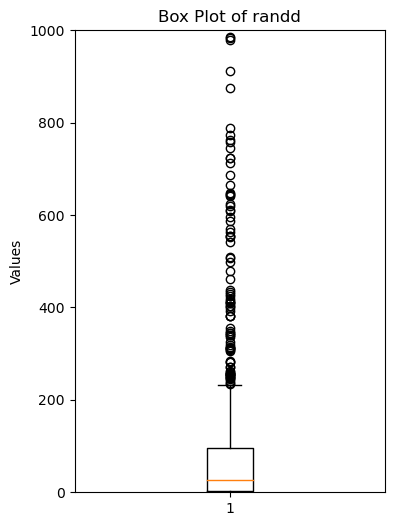

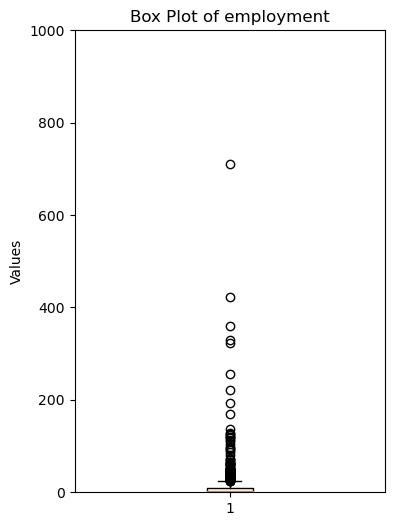

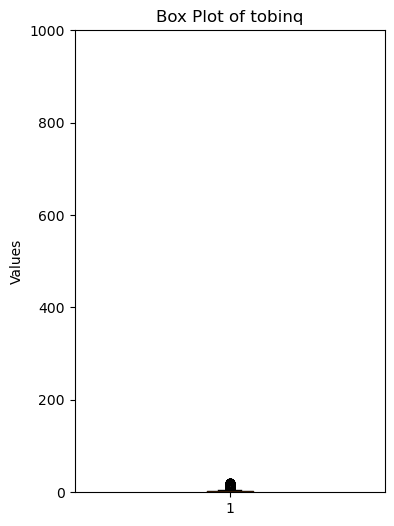

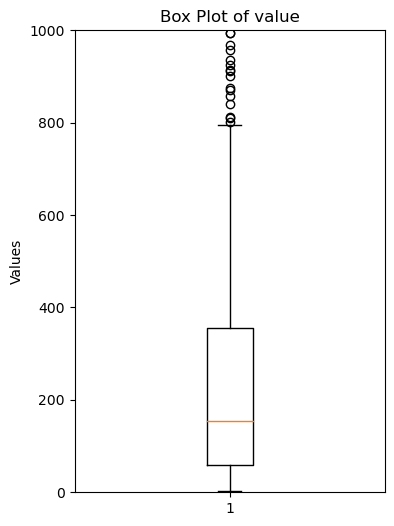

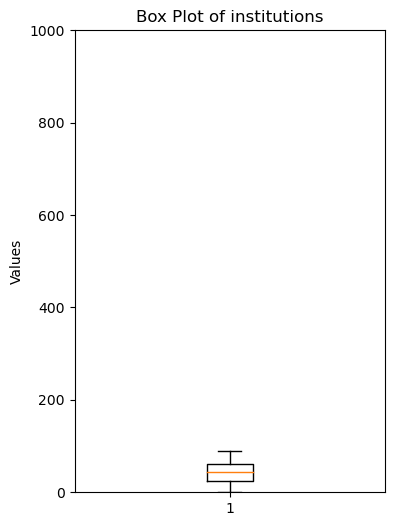

In [32]:
# Remove non-numeric columns from the list
numeric_columns = [col for col in numeric_columns if df[col].dtype != object]

# Box plots for each numeric column
for column in numeric_columns:
    plt.figure(figsize=(4, 6))
    plt.boxplot(df[df[column] <= 1000][column].dropna())
    plt.title(f'Box Plot of {column}')
    plt.ylabel('Values')
    plt.ylim(0, 1000)
    plt.show()

### Creating a Scatter plot

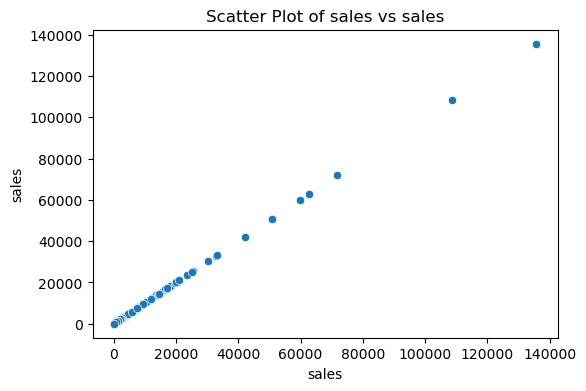

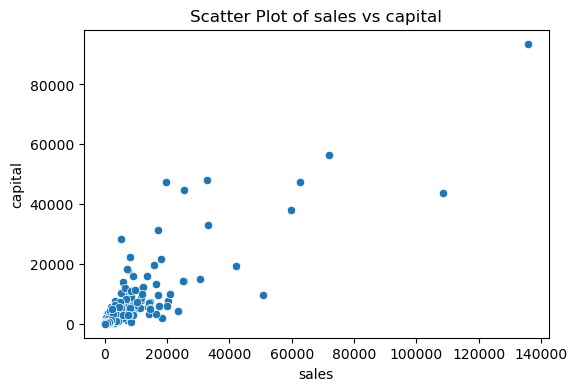

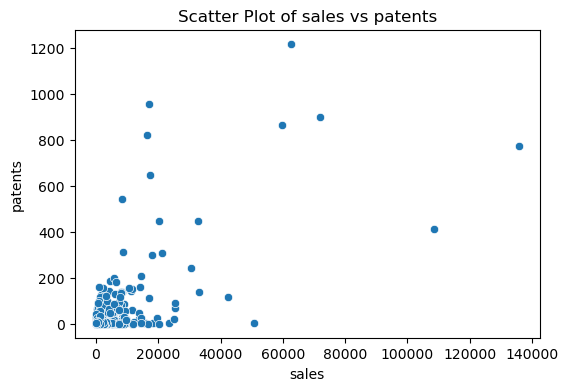

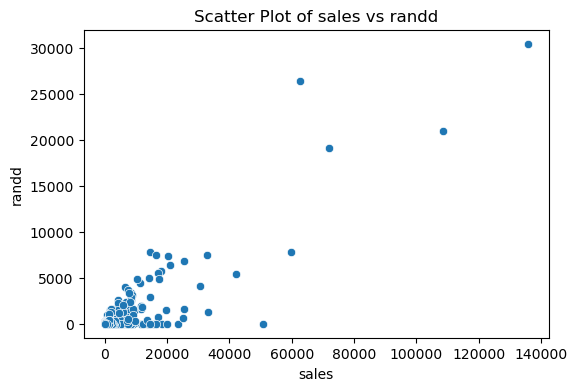

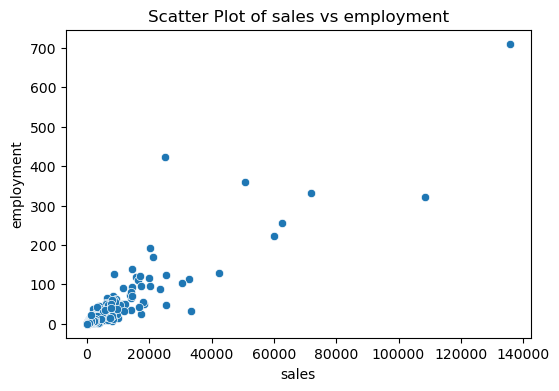

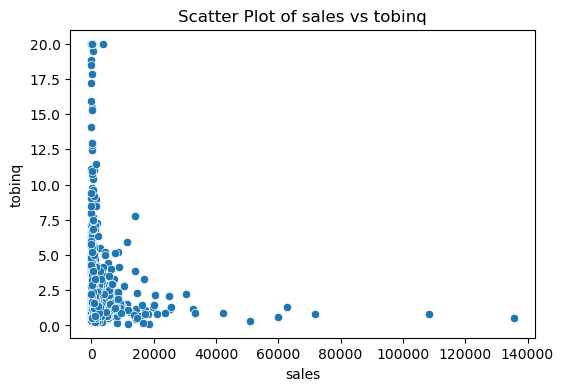

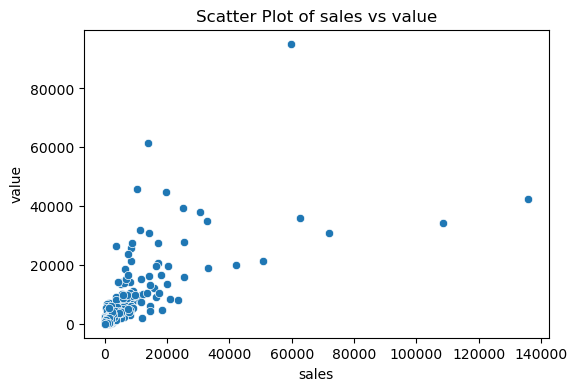

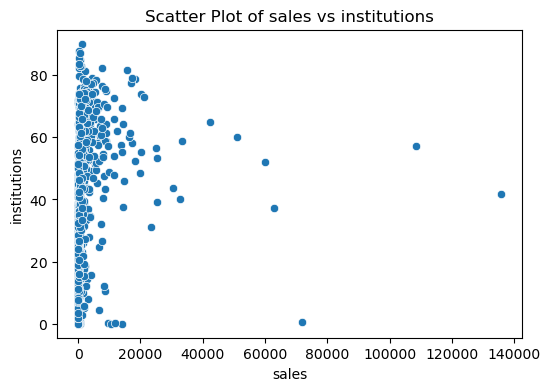

In [33]:
# Scatter plots for each numeric column against 'sales'
for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x='sales', y=column, data=df)
    plt.title(f'Scatter Plot of sales vs {column}')
    plt.xlabel('sales')
    plt.ylabel(column)
    plt.show()

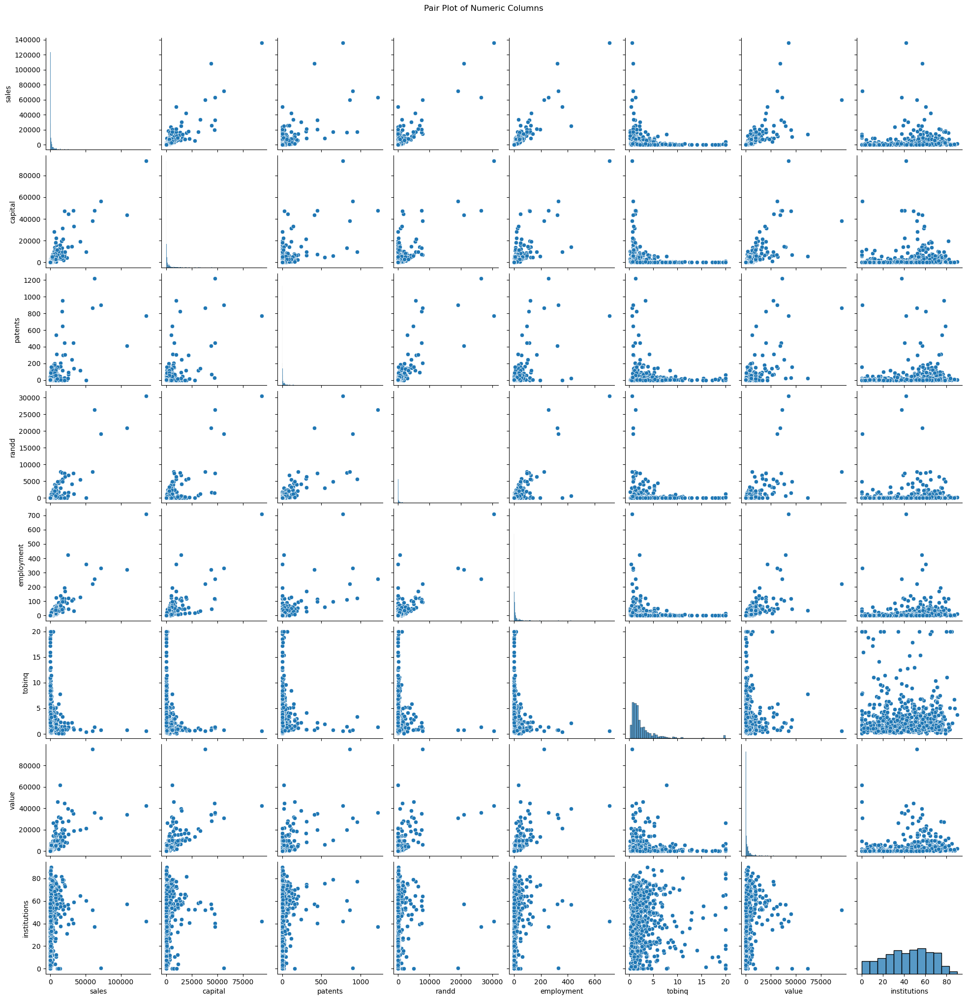

In [34]:
# Pair plot for all numeric columns
sns.pairplot(df[numeric_columns])
plt.suptitle("Pair Plot of Numeric Columns", y=1.02)
plt.show()

## Scaling the DataFrame so that there are no discrepensies in the values.
### we do this by standard scaling the df

In [36]:
# Label Encoding for categorical variables
label_encoder = LabelEncoder()
for col in categorical_columns:
    df[col] = label_encoder.fit_transform(df[col])

# Standard Scaling for numeric variables
scaler = StandardScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# Print the encoded and scaled DataFrame
print(df)

     Unnamed: 0     sales   capital   patents     randd  employment  sp500  \
0             0 -0.213704 -0.281030 -0.162882 -0.028842   -0.273914      0   
1             1 -0.261802 -0.287143 -0.245190 -0.219303   -0.284216      0   
2             2  0.656027  0.656624  1.154052  1.424056    0.819869      1   
3             3 -0.256841 -0.264737 -0.255479 -0.177659   -0.256243      0   
4             4 -0.288514 -0.284354 -0.245190 -0.212208   -0.282206      0   
..          ...       ...       ...       ...       ...         ...    ...   
754         754 -0.164726 -0.196435  0.063466 -0.013460    0.183298      1   
755         755 -0.288870 -0.294638 -0.255479 -0.219284   -0.288281      0   
756         756 -0.285325 -0.286861 -0.132016 -0.181986   -0.293455      0   
757         757 -0.218443 -0.284562 -0.204036 -0.218993   -0.260193      1   
758         758 -0.305978 -0.303833 -0.214324 -0.210044   -0.322628      0   

       tobinq     value  institutions  
0    2.493756 -0.156696

In [37]:
df

,Unnamed: 0,sales,capital,patents,randd,employment,sp500,tobinq,value,institutions
0,0,-0.213704,-0.281030,-0.162882,-0.028842,-0.273914,0,2.493756,-0.156696,1.718839
1,1,-0.261802,-0.287143,-0.245190,-0.219303,-0.284216,0,-0.577847,-0.352317,0.738279
2,2,0.656027,0.656624,1.154052,1.424056,0.819869,1,0.734749,3.273585,0.215929
3,3,-0.256841,-0.264737,-0.255479,-0.177659,-0.256243,0,-0.740066,-0.377803,-0.744789
4,4,-0.288514,-0.284354,-0.245190,-0.212208,-0.282206,0,-0.511899,-0.377183,0.297142
...,...,...,...,...,...,...,...,...,...,...
754,754,-0.164726,-0.196435,0.063466,-0.013460,0.183298,1,-0.622011,-0.348920,-0.439316
755,755,-0.288870,-0.294638,-0.255479,-0.219284,-0.288281,0,-0.326193,-0.354389,0.156403
756,756,-0.285325,-0.286861,-0.132016,-0.181986,-0.293455,0,0.742113,-0.304582,-0.035556
757,757,-0.218443,-0.284562,-0.204036,-0.218993,-0.260193,1,-0.342718,-0.342861,0.847640


In [40]:
# Separate features (attributes) and target (sales)
x = df.drop('sales', axis=1)
y = df['sales']


In [41]:
x

,Unnamed: 0,capital,patents,randd,employment,sp500,tobinq,value,institutions
0,0,-0.281030,-0.162882,-0.028842,-0.273914,0,2.493756,-0.156696,1.718839
1,1,-0.287143,-0.245190,-0.219303,-0.284216,0,-0.577847,-0.352317,0.738279
2,2,0.656624,1.154052,1.424056,0.819869,1,0.734749,3.273585,0.215929
3,3,-0.264737,-0.255479,-0.177659,-0.256243,0,-0.740066,-0.377803,-0.744789
4,4,-0.284354,-0.245190,-0.212208,-0.282206,0,-0.511899,-0.377183,0.297142
...,...,...,...,...,...,...,...,...,...
754,754,-0.196435,0.063466,-0.013460,0.183298,1,-0.622011,-0.348920,-0.439316
755,755,-0.294638,-0.255479,-0.219284,-0.288281,0,-0.326193,-0.354389,0.156403
756,756,-0.286861,-0.132016,-0.181986,-0.293455,0,0.742113,-0.304582,-0.035556
757,757,-0.284562,-0.204036,-0.218993,-0.260193,1,-0.342718,-0.342861,0.847640


In [42]:
y

0     -0.213704
1     -0.261802
2      0.656027
3     -0.256841
4     -0.288514
         ...   
754   -0.164726
755   -0.288870
756   -0.285325
757   -0.218443
758   -0.305978
Name: sales, Length: 759, dtype: float64

In [43]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [44]:
from sklearn.linear_model import LinearRegression
linear = LinearRegression()
linear.fit(x,y)

LinearRegression()

In [45]:
linear.intercept_

0.011722141821339647

In [46]:
linear.coef_

array([-2.09501864e-05,  2.40167775e-01, -1.31286186e-01,  4.05094510e-01,
        4.16460569e-01, -1.32283597e-02, -1.71601775e-02,  1.08275245e-01,
        1.53101244e-02])

In [47]:
linear.score(x,y)

0.9292256589466213

In [48]:
y_train_pred = linear.predict(X_train)

# Make predictions on the test data
y_test_pred = linear.predict(X_test)

# Calculate RMSE for both train and test sets
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Calculate MAE for both train and test sets
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

# Calculate R-squared for both train and test sets
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train set:")
print("RMSE:", rmse_train)
print("MAE:", mae_train)
print("R-squared (R2):", r2_train)

print("\nTest set:")
print("RMSE:", rmse_test)
print("MAE:", mae_test)
print("R-squared (R2):", r2_test)

Train set:
RMSE: 0.2772665315257359
MAE: 0.09221662051175511
R-squared (R2): 0.9351522669417188

Test set:
RMSE: 0.23782808818450074
MAE: 0.08382425384488015
R-squared (R2): 0.9001669063696619
